In [66]:
#imports

In [67]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [68]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.5 anndata==0.9.1 umap==0.5.4 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.10


In [69]:
results_file ='pbmc_allen.h5ad'

In [70]:
adata = sc.read_10x_h5('/Users/pfb16/final_project/pfbseq/scSEQ_data/GSM5123955_X066-RP0C1W1_leukopak_perm-cells_cite_200M_rna_counts.h5')#replace with path to your dataset

reading /Users/pfb16/final_project/pfbseq/scSEQ_data/GSM5123955_X066-RP0C1W1_leukopak_perm-cells_cite_200M_rna_counts.h5
 (0:00:00)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [71]:
adata.var_names_make_unique() # make unique var names

In [72]:
adata

AnnData object with n_obs × n_vars = 7657 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

normalizing counts per cell
    finished (0:00:00)


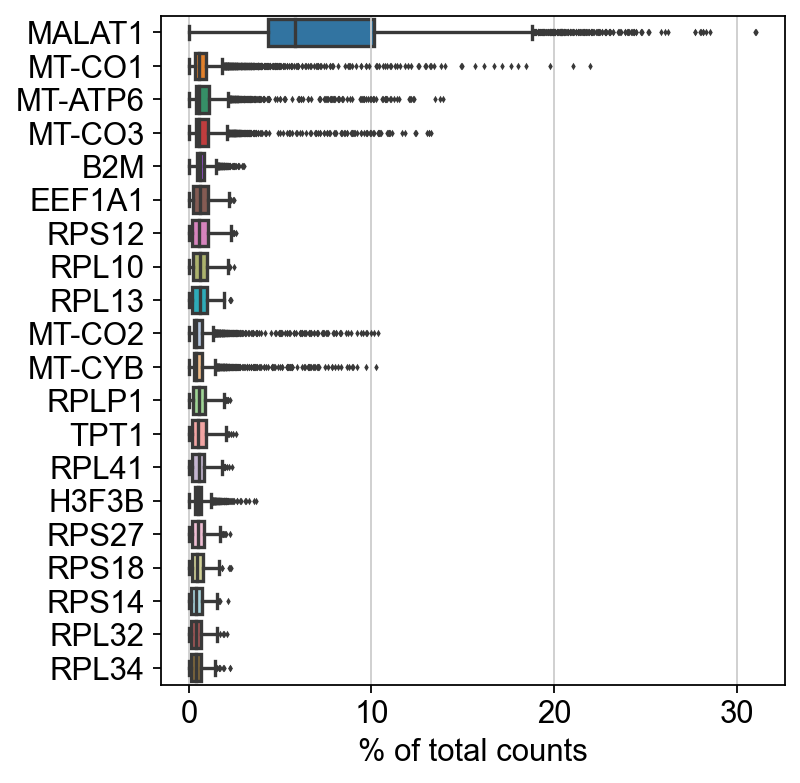

In [73]:
sc.pl.highest_expr_genes(adata, n_top=20, ) # Plotting genes that yield the highest fraction of counts in each single cell

In [74]:
sc.pp.filter_cells(adata, min_genes=200)# filters out cells with few transcripts
sc.pp.filter_genes(adata, min_cells=3) # filters out genes expressed in few cells

filtered out 21 cells that have less than 200 genes expressed
filtered out 12946 genes that are detected in less than 3 cells


In [75]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [76]:
density_norm='width'

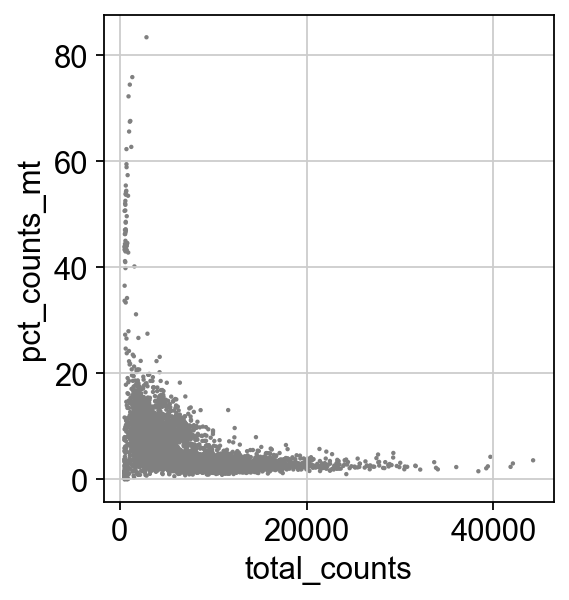

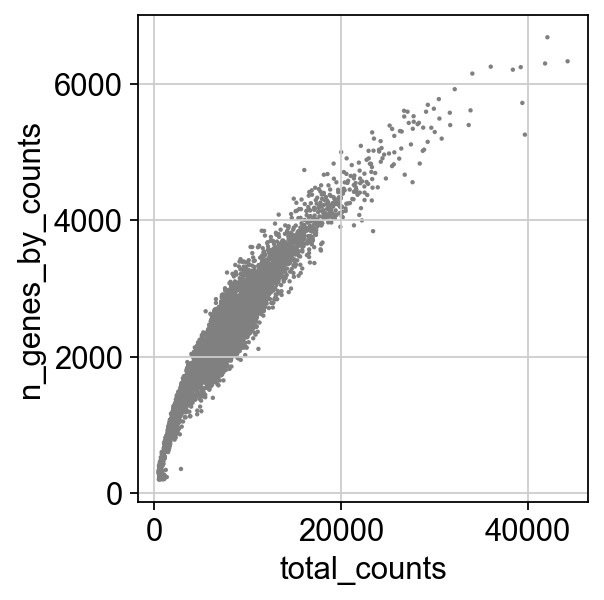

In [77]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [78]:
adata = adata[adata.obs.n_genes_by_counts < 2500, :] #Total-count normalize (library-size correct) the data matrix X to 10,000 reads per cell, so that counts become comparable among cells
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [79]:
sc.pp.normalize_total(adata, target_sum=1e4)#Logarithmize the data:

normalizing counts per cell
    finished (0:00:00)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [80]:
sc.pp.log1p(adata) #Identify highly-variable genes.

In [81]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5) # extracting highly variable genes

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


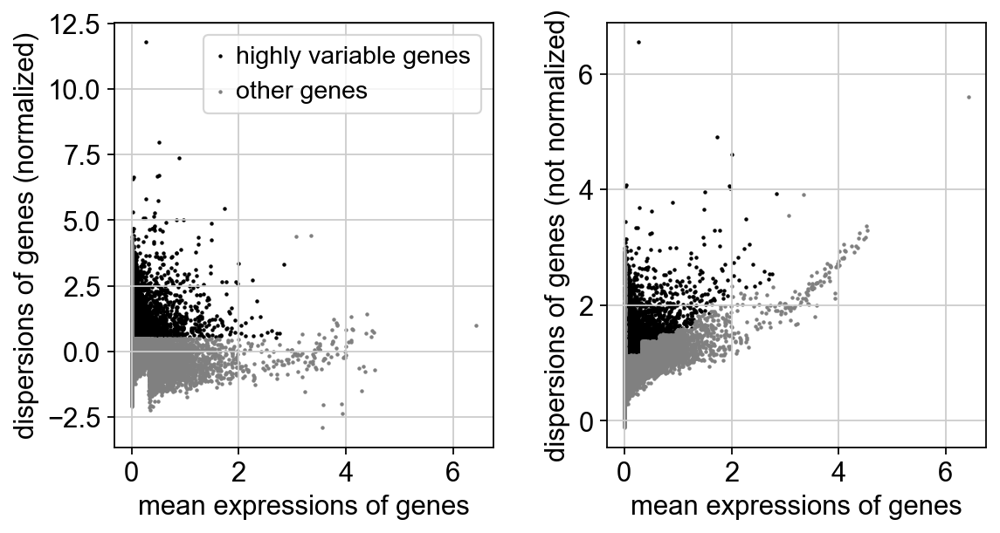

In [82]:
sc.pl.highly_variable_genes(adata) #Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
#You can get back an AnnData of the object in .raw by calling .raw.to_adata().

In [83]:
adata.raw = adata

In [84]:
adata = adata[:, adata.var.highly_variable] #Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.


In [85]:
adata.var_names
out_file = 'all_PBMC_genelist.txt'
adata.var[['gene_ids']].to_csv('./all_PBMC_genelist.csv')

In [86]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt']) #Scale each gene to unit variance. Clip values exceeding standard deviation 10.


regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:14)


In [87]:
sc.tl.pca(adata, svd_solver='arpack') #We can make a scatter plot in the PCA coordinates, but we will not use that later on.

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


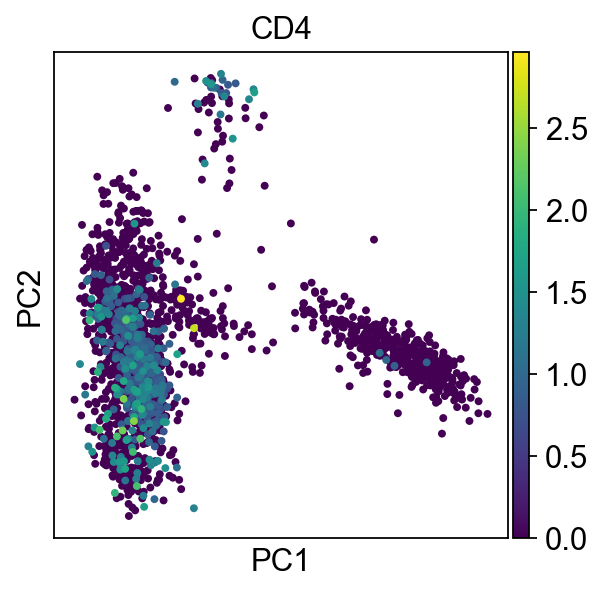

In [88]:
sc.pl.pca(adata, color='CD4')

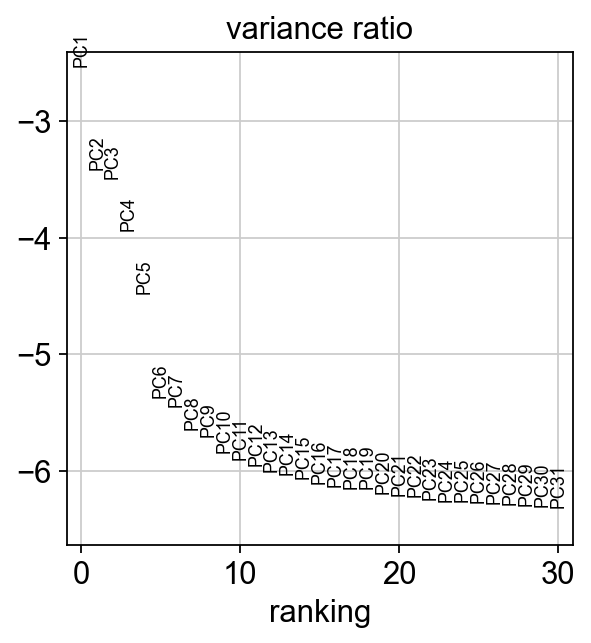

In [89]:
sc.pl.pca_variance_ratio(adata, log=True)

In [90]:
adata.write(results_file)

In [91]:
adata

AnnData object with n_obs × n_vars = 2373 × 4643
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [92]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [93]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


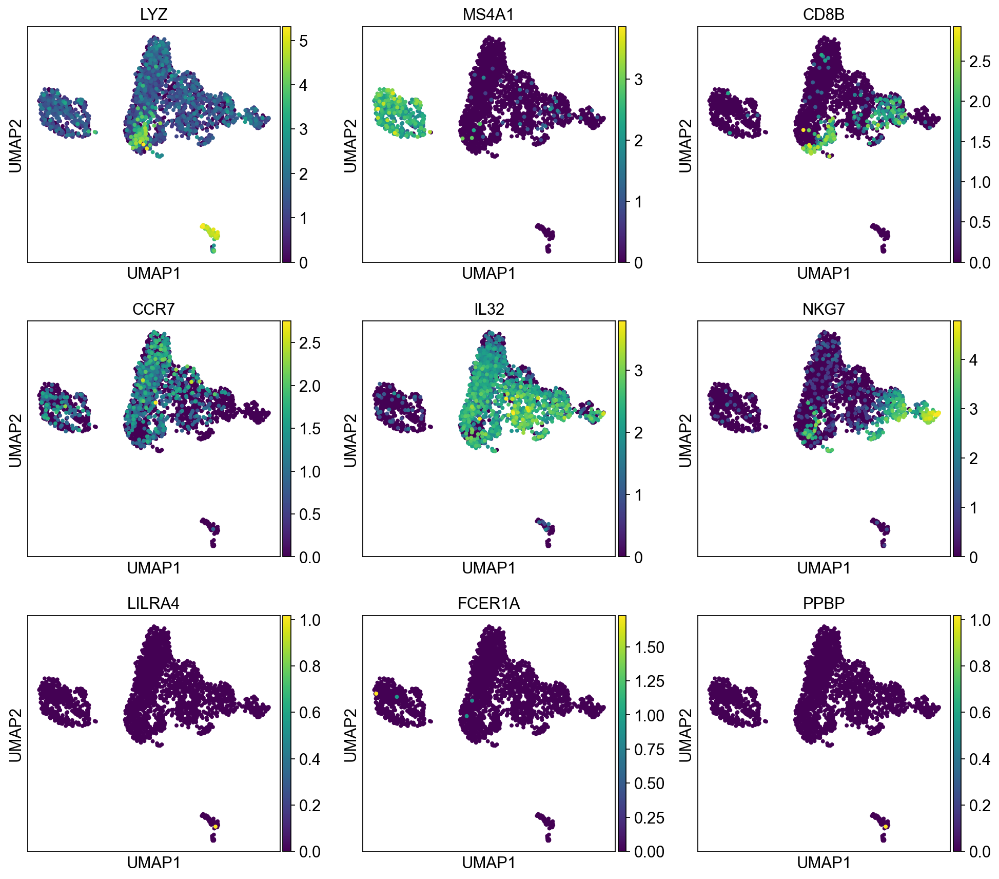

In [94]:
sc.pl.umap(adata, color=['LYZ','MS4A1','CD8B','CCR7','IL32','NKG7','LILRA4','FCER1A','PPBP'], ncols = 3)

In [95]:
sc.tl.leiden(adata, resolution = 1.2, key_added = "leiden_1.2")
sc.tl.leiden(adata, resolution = 1.5, key_added = "leiden_1.5")
sc.tl.leiden(adata, resolution = 2.0, key_added = "leiden_2.0")

running Leiden clustering
    finished: found 14 clusters and added
    'leiden_1.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_1.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_2.0', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


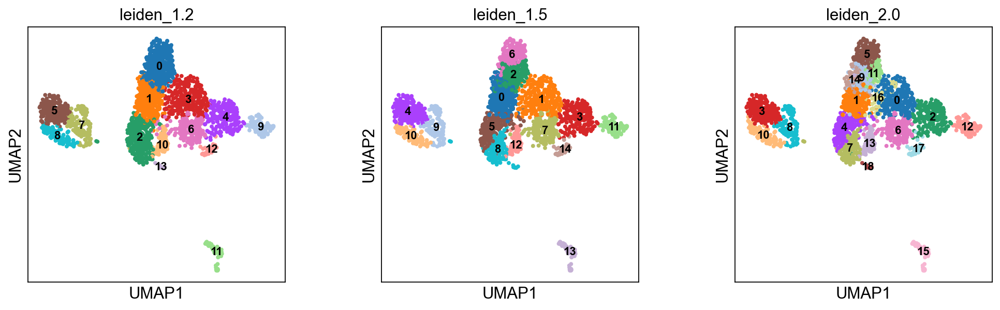

In [96]:
sc.pl.umap(adata, color=['leiden_1.2', 'leiden_1.5', 'leiden_2.0'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


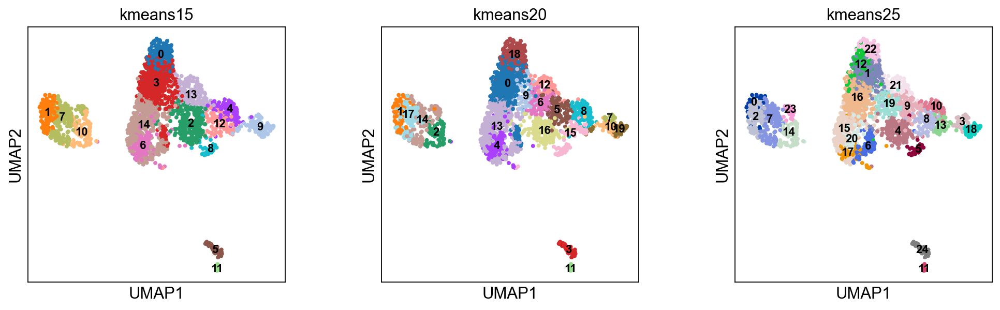

In [97]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
X_pca = adata.obsm['X_pca'] 

kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca) 
adata.obs['kmeans15'] = kmeans.labels_.astype(str)
kmeans = KMeans(n_clusters=20, random_state=0).fit(X_pca) 
adata.obs['kmeans20'] = kmeans.labels_.astype(str)
kmeans = KMeans(n_clusters=25, random_state=0).fit(X_pca) 
adata.obs['kmeans25'] = kmeans.labels_.astype(str)

sc.pl.umap(adata, color=['kmeans15', 'kmeans20', 'kmeans25'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


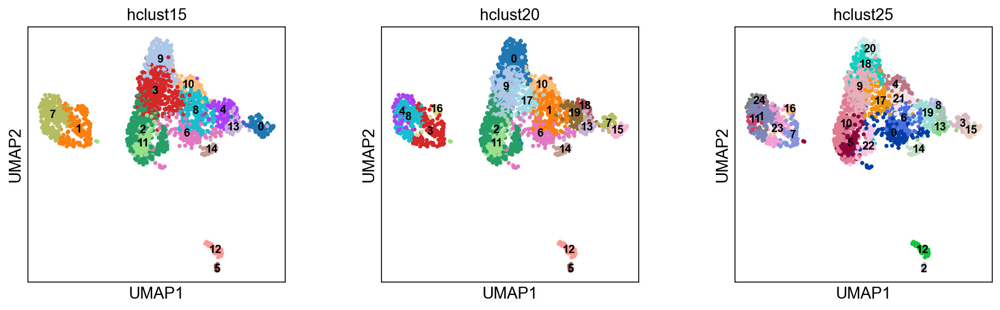

In [98]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=15, affinity='euclidean', linkage='ward')
adata.obs['hclust15'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=20, affinity='euclidean', linkage='ward')
adata.obs['hclust20'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=25, affinity='euclidean', linkage='ward')
adata.obs['hclust25'] = cluster.fit_predict(X_pca).astype(str)

sc.pl.umap(adata, color=['hclust15', 'hclust20', 'hclust25'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

In [99]:
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=7)
sc.tl.umap(adata)
sc.tl.leiden(adata)

computing neighbors
    using 'X_pca' with n_pcs = 7
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [100]:
adata.obs['leiden'].value_counts()

0     194
1     191
2     191
3     158
4     157
5     149
6     141
7     134
8     124
9     115
10    111
11    110
12    107
13     83
14     79
15     79
16     72
17     65
18     61
19     43
20      9
Name: leiden, dtype: int64

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


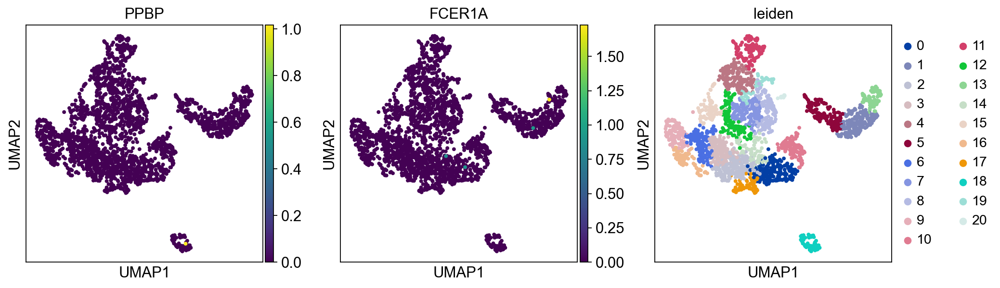

In [101]:
sc.pl.umap(adata, color=['PPBP','FCER1A','leiden']) #platelets and myeloid cells aren't present in this dataset

In [102]:
#platelets.obs_names

In [103]:
#adata.obs['leiden'] = adata.obs['leiden'].cat.add_categories('16')
#adata.obs.loc[lambda df: df.index.isin(platelets.obs.index),'leiden'] = '16'

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


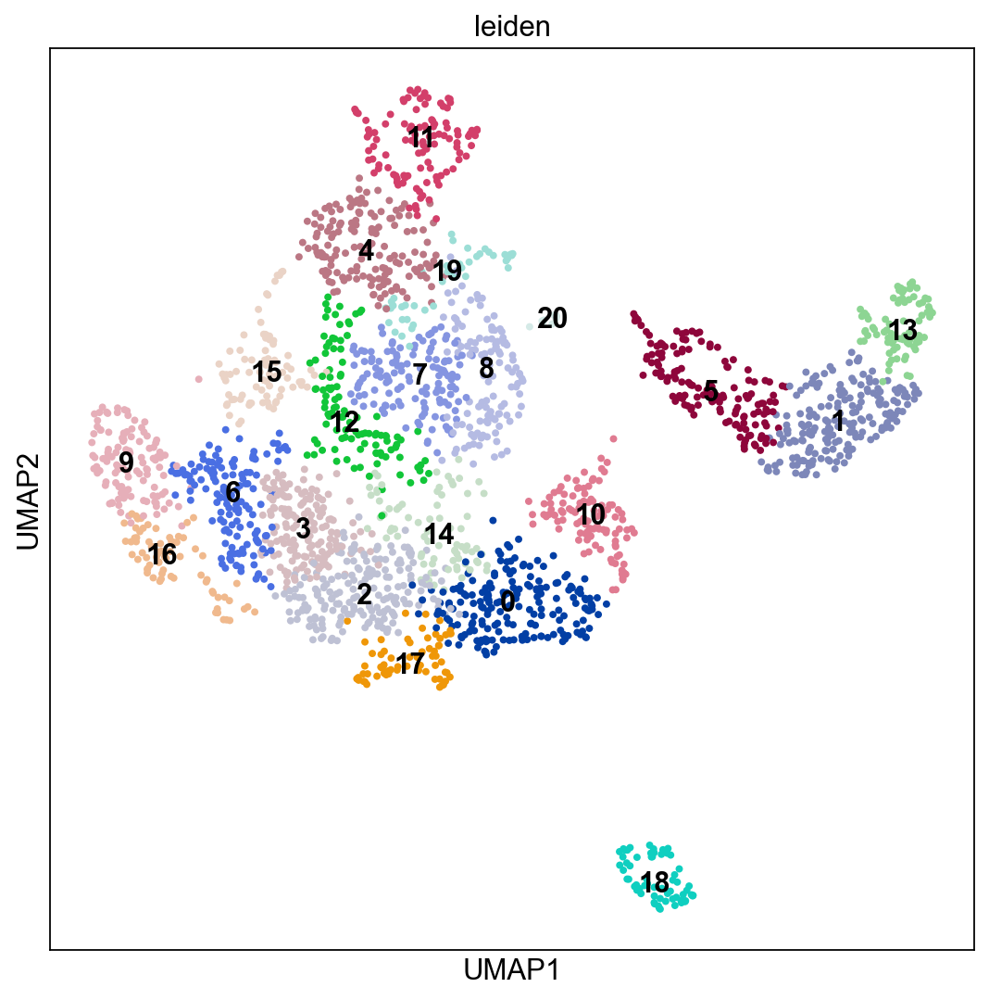

In [104]:
with plt.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

In [105]:
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
adata.var.highly_variable.value_counts()


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


False    3782
True      861
Name: highly_variable, dtype: int64

In [106]:
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 2373 × 861
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1.2', 'leiden_1.5', 'leiden_2.0', 'kmeans15', 'kmeans20', 'kmeans25', 'hclust15', 'hclust20', 'hclust25', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_1.2_colors', 'leiden_1.5_colors', 'leiden_2.0_colors', 'kmeans15_colors', 'kmeans20_colors', 'kmeans25_colors', 'hclust15_colors', 'hclust20_colors', 'hclust25_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [107]:
sc.pp.scale(adata, max_value=10)

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:842: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


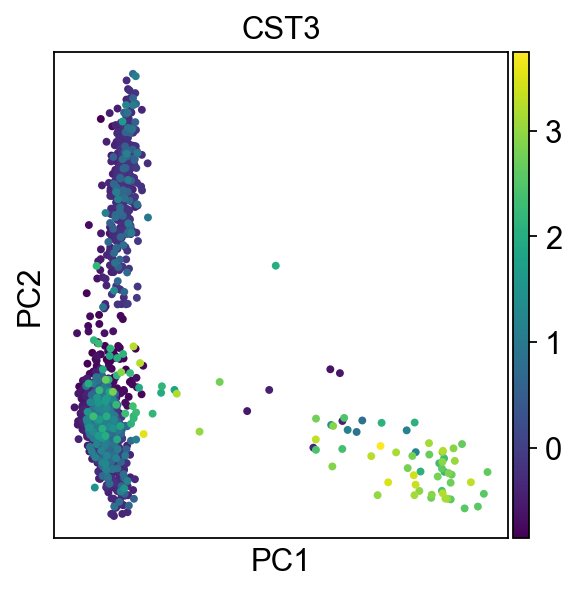

In [108]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CST3')

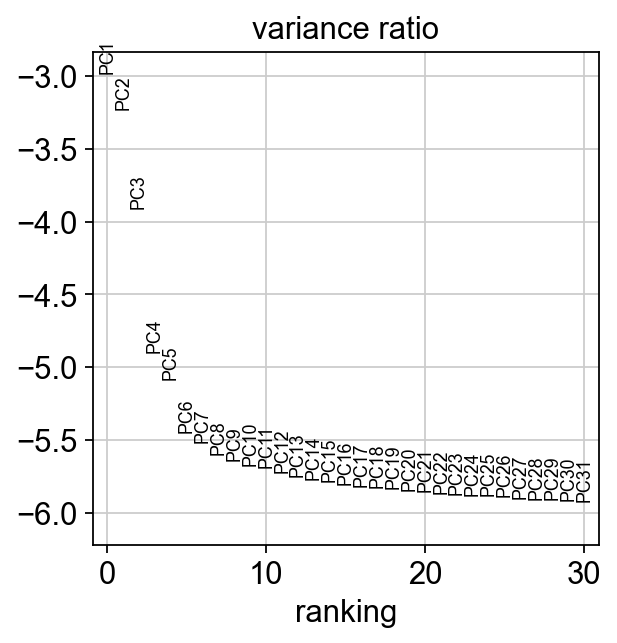

In [109]:
sc.pl.pca_variance_ratio(adata, log=True)

In [110]:
sc.tl.leiden(adata,resolution = 0.8)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


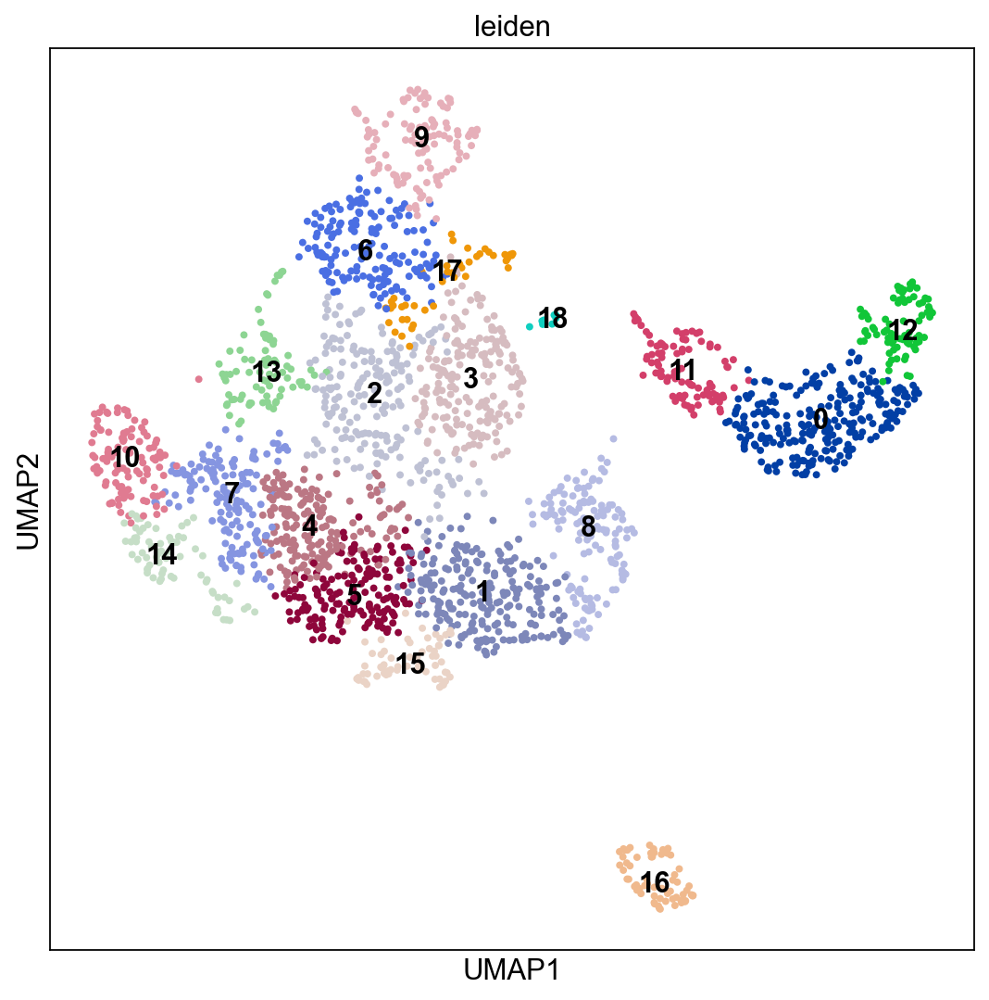

In [111]:
with plt.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

In [112]:
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


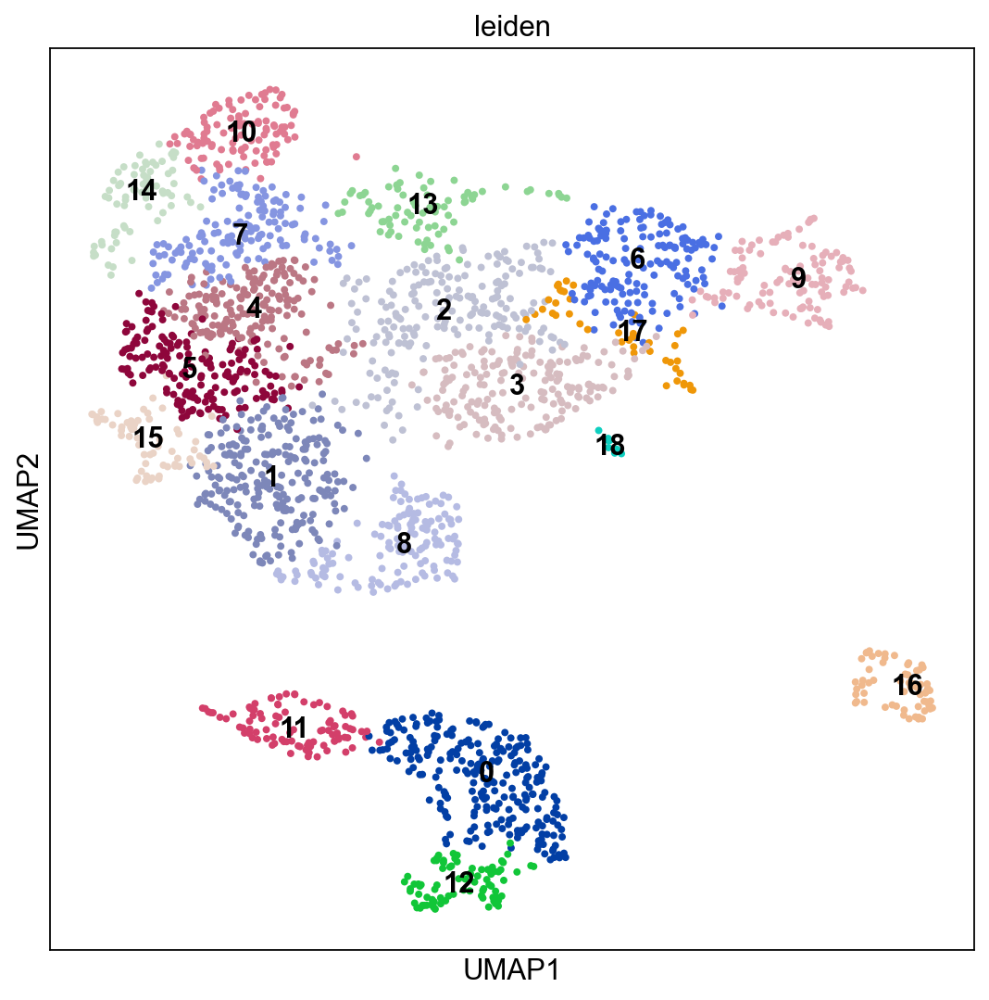

In [113]:
with plt.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'],legend_loc='on data')


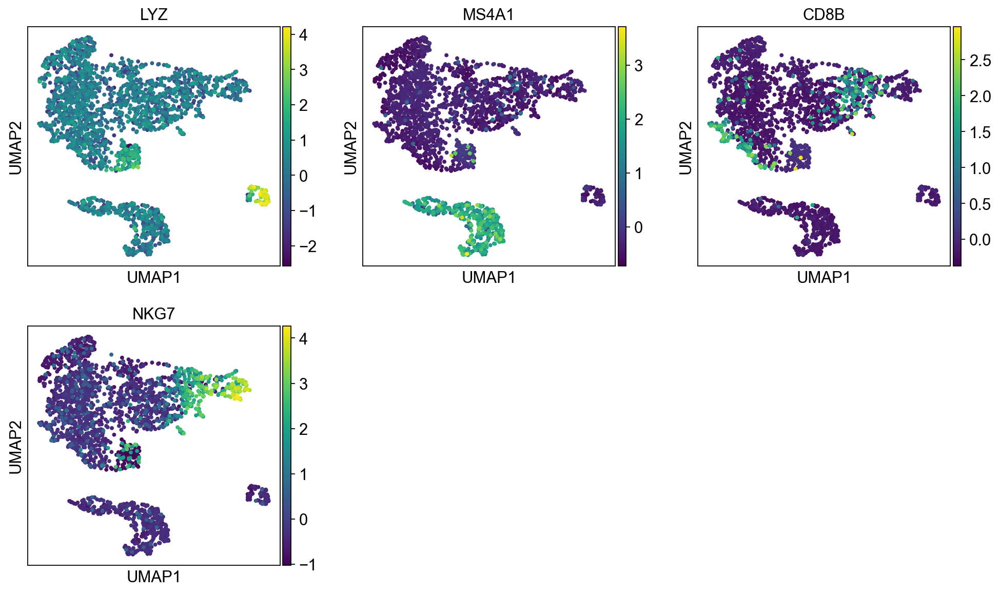

In [114]:
sc.pl.umap(adata, color=['LYZ','MS4A1','CD8B','NKG7'], ncols = 3)

In [115]:
sc.tl.leiden(adata, resolution = 1.2, key_added = "leiden_1.2")
sc.tl.leiden(adata, resolution = 1.5, key_added = "leiden_1.5")
sc.tl.leiden(adata, resolution = 2.0, key_added = "leiden_2.0")

running Leiden clustering
    finished: found 23 clusters and added
    'leiden_1.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 28 clusters and added
    'leiden_1.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 38 clusters and added
    'leiden_2.0', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


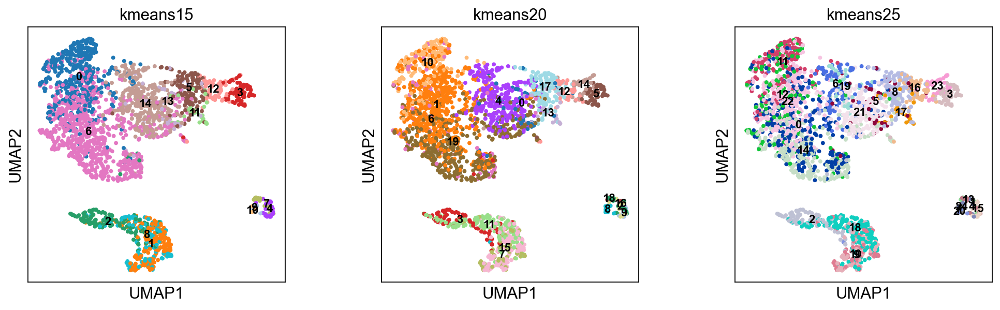

In [116]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
X_pca = adata.obsm['X_pca'] 

kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca) 
adata.obs['kmeans15'] = kmeans.labels_.astype(str)
kmeans = KMeans(n_clusters=20, random_state=0).fit(X_pca) 
adata.obs['kmeans20'] = kmeans.labels_.astype(str)
kmeans = KMeans(n_clusters=25, random_state=0).fit(X_pca) 
adata.obs['kmeans25'] = kmeans.labels_.astype(str)

sc.pl.umap(adata, color=['kmeans15', 'kmeans20', 'kmeans25'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


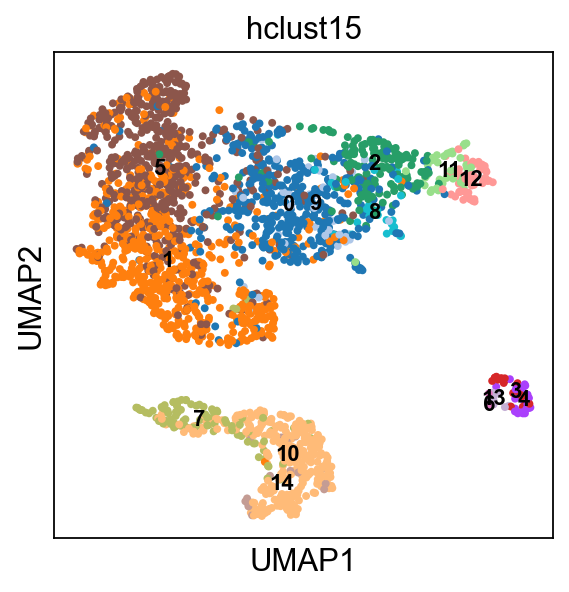

In [117]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=15, affinity='euclidean', linkage='ward')
adata.obs['hclust15'] = cluster.fit_predict(X_pca).astype(str)
sc.pl.umap(adata, color=['hclust15'], legend_loc='on data', wspace = 0.25, legend_fontsize=10)

/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


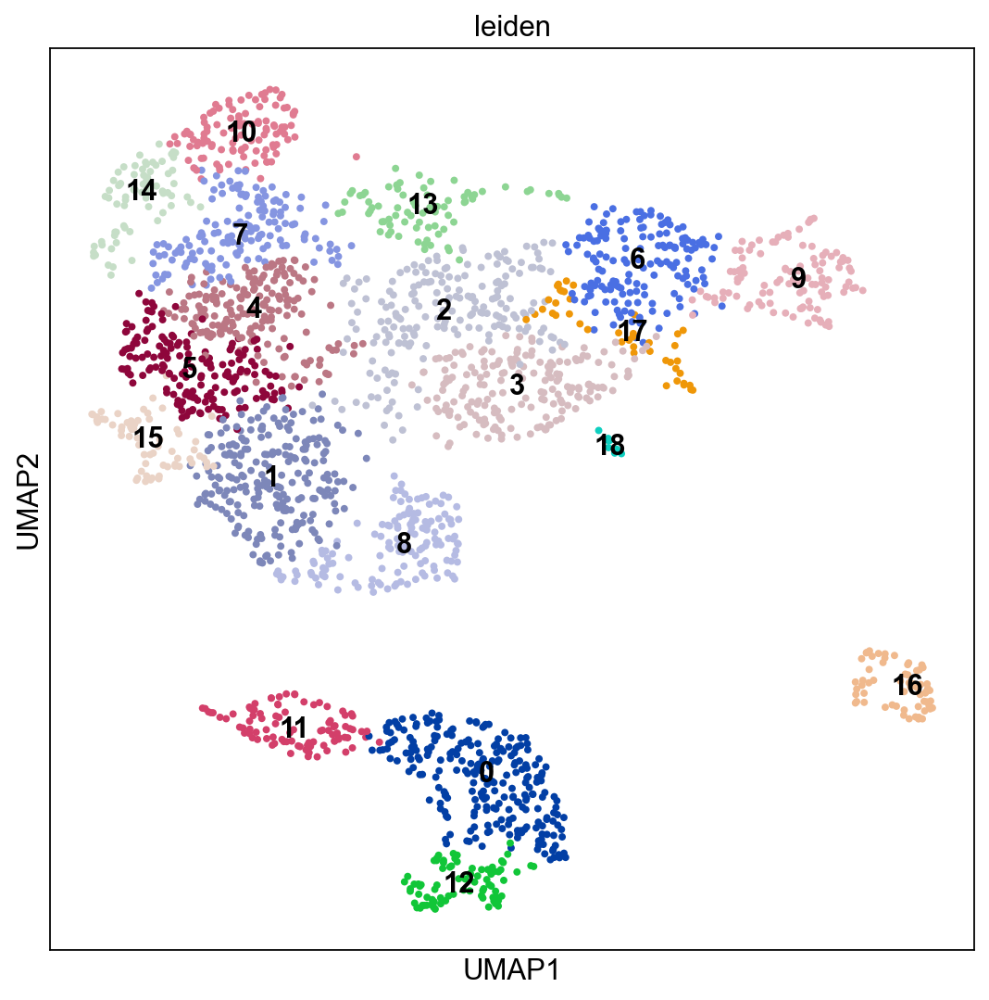

In [118]:
with plt.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'],legend_loc='on data')

In [119]:
adata.write(results_file)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/pfb16/miniconda3/envs/final_project/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value

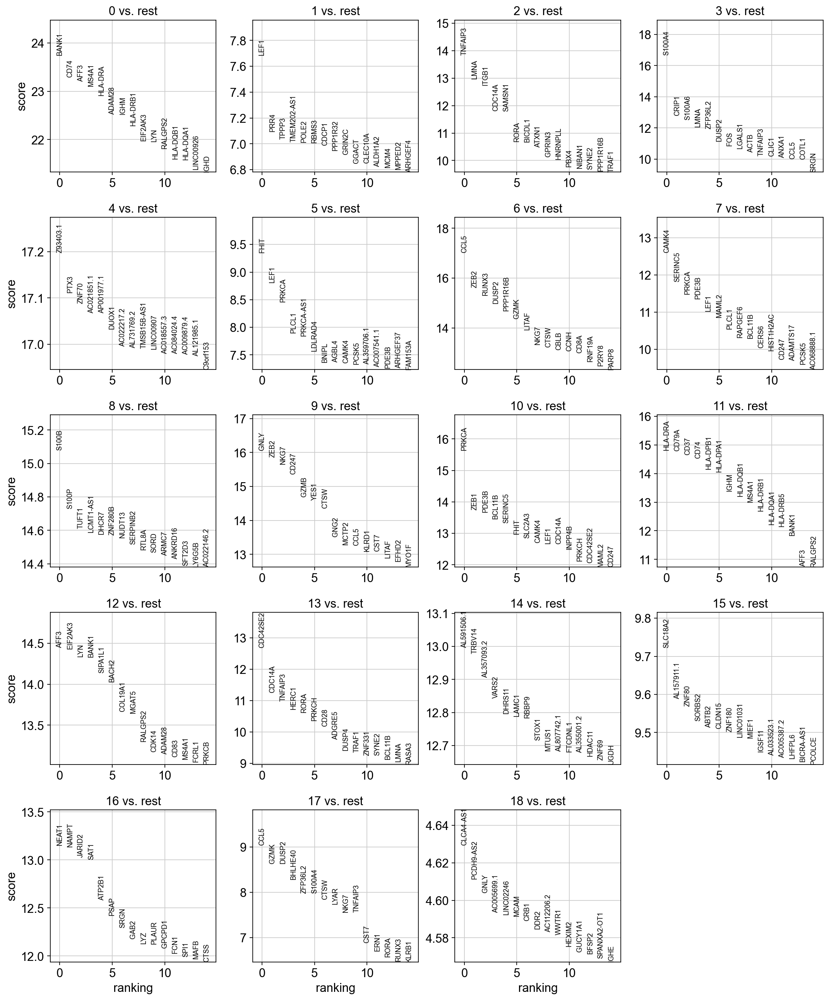

In [120]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [121]:
adata.write(results_file)

In [122]:
marker_genes = ['CD4', 'CD8A','PTPRC']

In [138]:
pd.DataFrame(adata.uns['rank_genes_groups']['names'])


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,BANK1,LEF1,TNFAIP3,S100A4,Z93403.1,FHIT,CCL5,CAMK4,S100B,GNLY,PRKCA,HLA-DRA,AFF3,CDC42SE2,AL591506.1,SLC18A2,NEAT1,CCL5,CLCA4-AS1
1,CD74,PRR4,LMNA,CRIP1,PTX3,LEF1,ZEB2,SERINC5,S100P,ZEB2,ZEB1,CD79A,EIF2AK3,CDC14A,TRBV14,AL157911.1,NAMPT,GZMK,PCDH9-AS2
2,AFF3,TPPP3,ITGB1,S100A6,ZNF70,PRKCA,RUNX3,PRKCA,TUFT1,NKG7,PDE3B,CD37,LYN,TNFAIP3,AL357093.2,ZNF80,JARID2,DUSP2,GNLY
3,MS4A1,TMEM202-AS1,CDC14A,LMNA,AC021851.1,PLCL1,DUSP2,PDE3B,LCMT1-AS1,CD247,BCL11B,CD74,BANK1,HERC1,VARS2,SORBS2,SAT1,BHLHE40,AC005699.1
4,HLA-DRA,POLE2,SAMSN1,ZFP36L2,AP001977.1,PRKCA-AS1,PPP1R16B,LEF1,DHCR7,GZMB,SERINC5,HLA-DPB1,SIPA1L1,RORA,DHRS11,ABTB2,ATP2B1,ZFP36L2,LINC02246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4638,CD247,PRKCB,SMARCAL1,UBE2E2,RBBP9,TRIP4,ID3,PRDX4,DTL,SESN3,METRNL,CD96,CD247,GZMB,CYBB,PDE9A,BCL11B,BANK1,UBOX5-AS1
4639,CD96,RNF19A,RPE,RALGPS2,CASP7,CLIC1,PELI1,LINC00892,SDC2,SNX9,CST7,SYTL3,ACTB,LYN,METRNL,DDAH2,CD247,MS4A1,PSMD14
4640,PRKCH,CDC42SE2,TFAP4,RAPGEF6,UGDH,PPP4C,TSHZ2,PTTG1,AC016074.2,PELI1,CCL4,CD247,PRKCH,AOAH,AC015849.1,SLC35E2A,ZEB1,UBE2E2,SLC9A3R1
4641,CAMK4,SMCHD1,AK5,AFF3,AL355001.2,PLP2,SNX9,TTC39C-AS1,S1PR5,ZEB1,MAP3K8,BCL11B,SRGN,FGFBP2,SLC15A4,CAPG,BACH2,CD79A,TSHZ2


In [124]:
adata.write('Cluster_PBMC_genelist.adata')

In [125]:
type(adata)

anndata._core.anndata.AnnData

In [126]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})

In [127]:
df.to_csv('Cluster_PBMC_genelist.tsv', sep='\t', index=False)

In [128]:
type(df)

pandas.core.frame.DataFrame

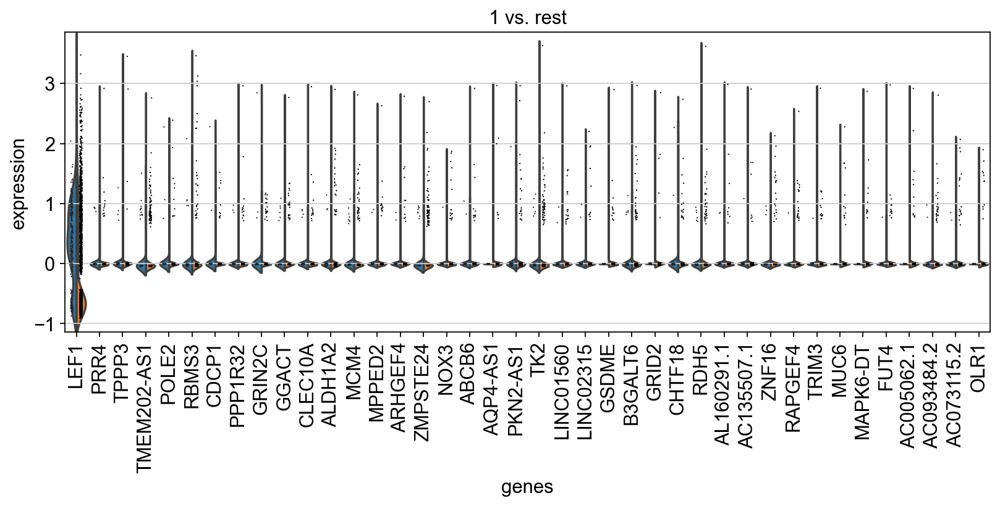

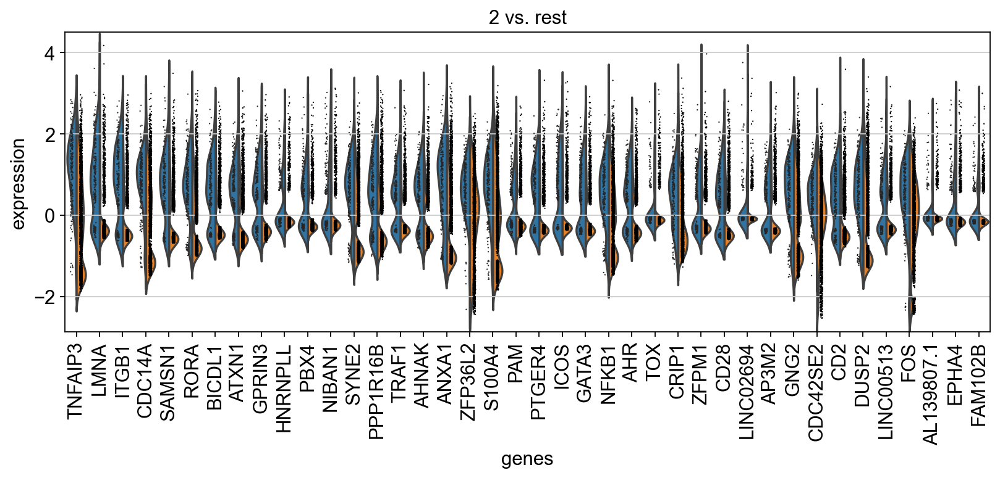

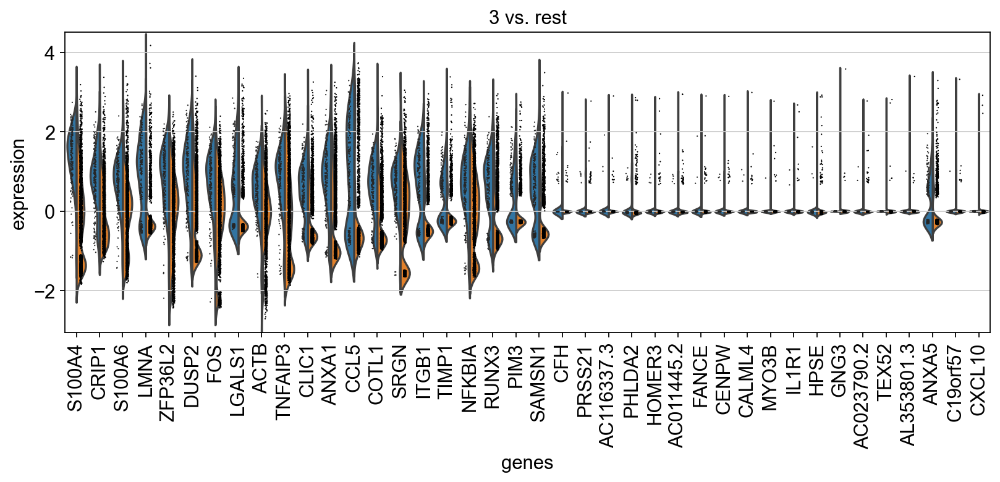

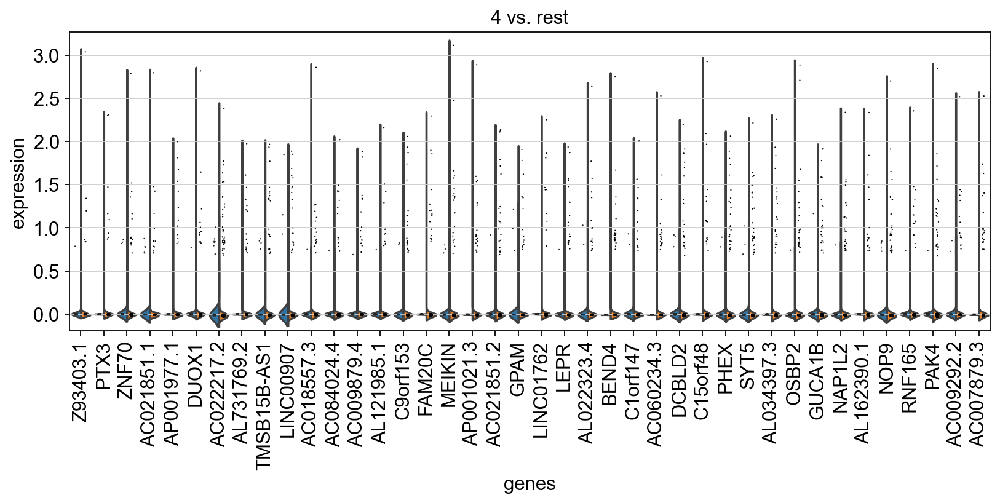

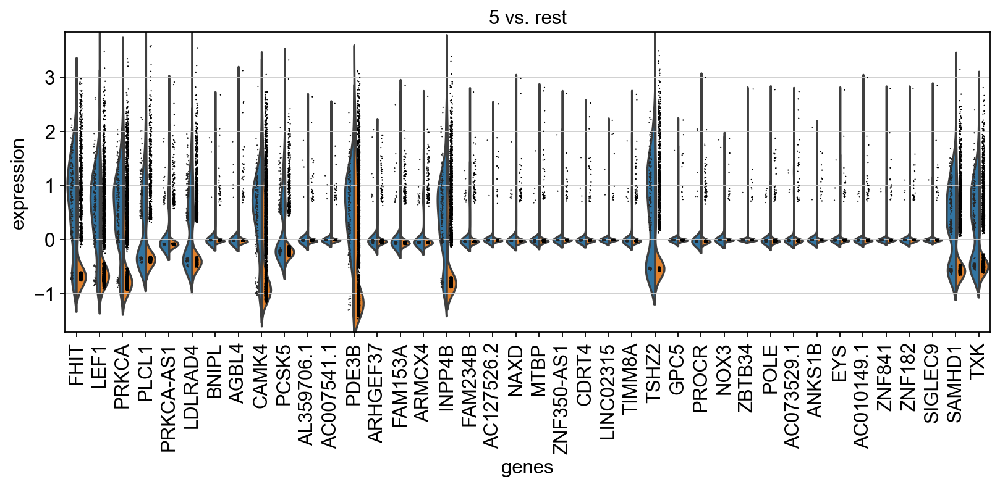

...

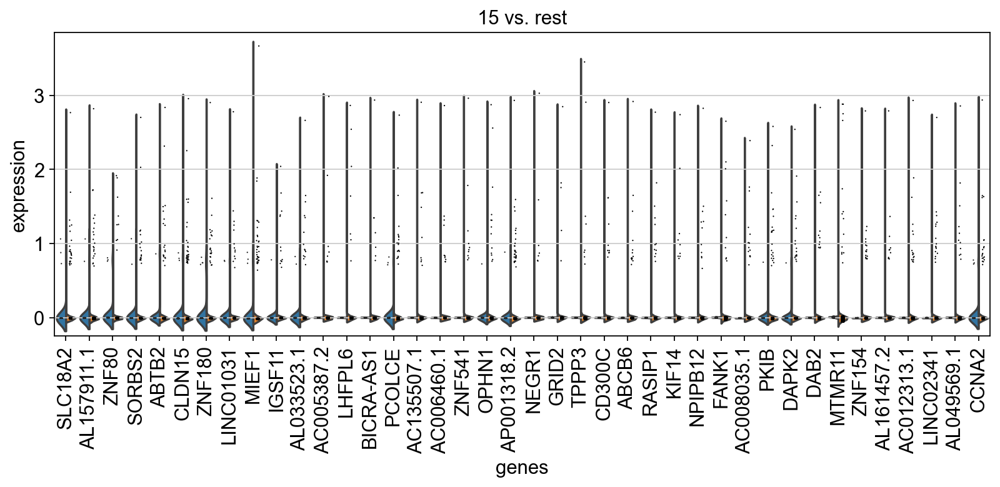

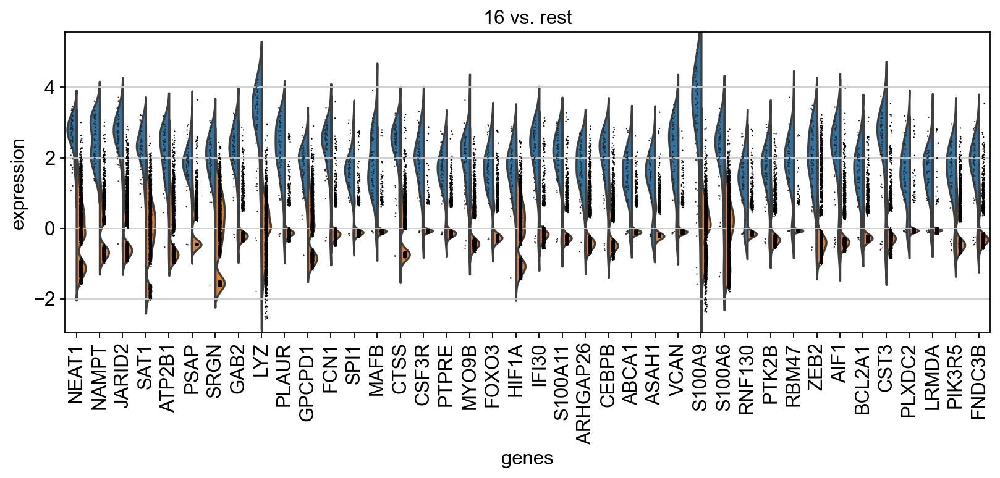

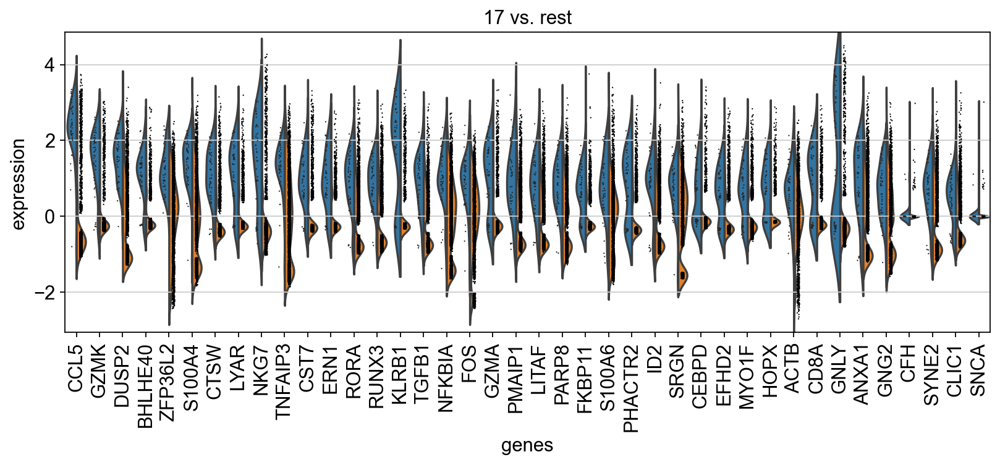

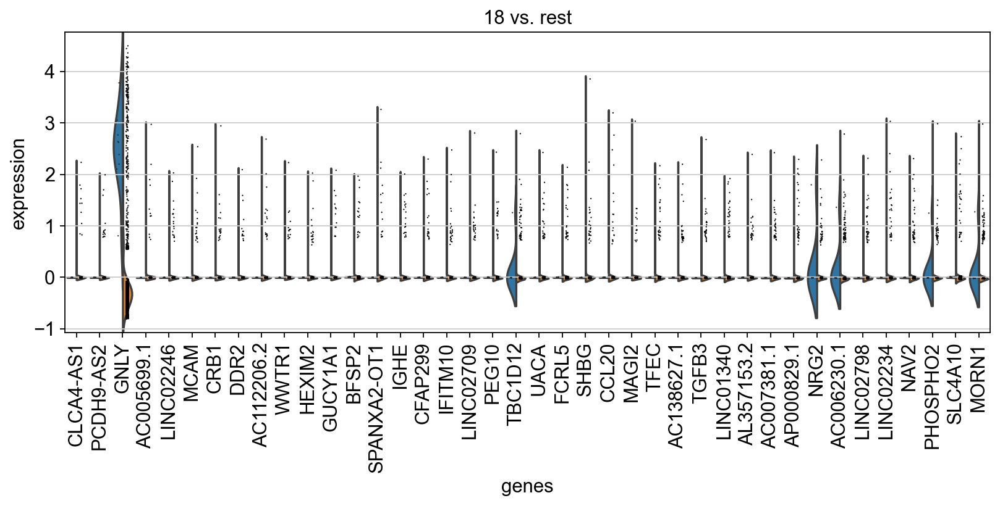

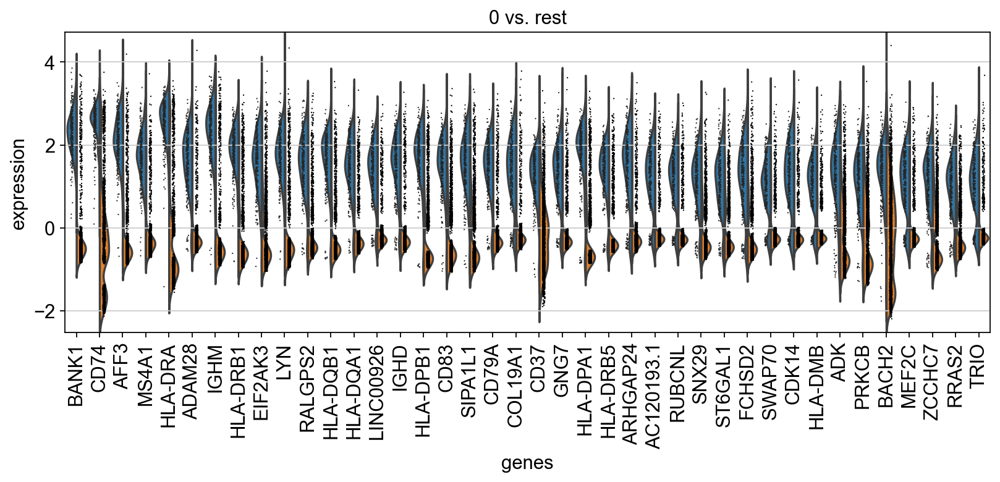

In [140]:
with plt.rc_context({'figure.figsize': (12, 4)}):
    sc.pl.rank_genes_groups_violin(adata, groups='1', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='2', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='3', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='4', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='5', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='6', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='7', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='8', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='9', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='10', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='11', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='12', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='13', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='14', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='15', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='16', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='17', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='18', n_genes=40)
    sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=40)
        
    

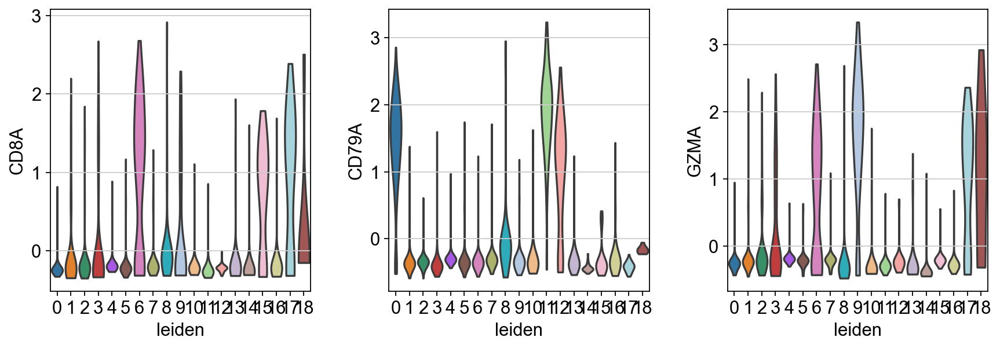

In [131]:
sc.pl.violin(adata, ['CD8A', 'CD79A', 'GZMA'], groupby='leiden', stripplot = False )